<a href="https://colab.research.google.com/github/HassanAlgoz/ml/blob/master/yolo_finetune.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Finetune Pretrained YOLOv8 on Custom Dataset

Tutorial objectives:

- Learn how to finetune pretrained YOLOv8 on custom dataset
- Learn how to adjust [training settings](https://docs.ultralytics.com/modes/train/#train-settings) and hyper-parameters
- Learh how to adjust [augmentation settings](https://docs.ultralytics.com/modes/train/#augmentation-settings-and-hyperparameters)
- Learn how to freeze weights of YOLOv8
- Learn how to resume training from last checkpoint
- Learn how to properly train a long-running model: i.e., how to schedule training to stop, your model to be saved (and downloaded to your machine), and Colab run-time to stop (to preserve compute units) after specified period

References:

- [How to Train YOLOv8 Object Detection on a Custom Dataset](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb) - roboflow/notebooks

In [1]:
import glob
from IPython.display import Image, display

### Install YOLOv8

In [2]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 6.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.8/201.2 GB disk)


In [4]:
from ultralytics import YOLO

### Python variables can be accessed from shell

In [5]:
import os

HOME = os.getcwd()

In [6]:
print(HOME)

/content


In [7]:
!echo $HOME

/content


## CLI

- task
- mode
- model
- other args...

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

In [8]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='https://media.roboflow.com/notebooks/examples/dog.jpeg', conf=0.25)

100%|██████████| 6.23M/6.23M [00:00<00:00, 80.4MB/s]

100%|██████████| 104k/104k [00:00<00:00, 61.1MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 115.3ms
Speed: 12.1ms preprocess, 115.3ms inference, 742.6ms postprocess per image at shape (1, 3, 640, 384)


### Load Custom Dataset from Roboflow

In [9]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="JEQ5drVZraFMQvIa1i1O")
project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
dataset = project.version(1).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.6 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to football-players-detection-1 in yolov8:: 100%|██████████| 1338/1338 [00:00<00:00, 2309.21it/s]


### Fine-tune last layers

**Transfer learning** is a useful way to quickly retrain a model on new data without having to retrain the entire network. This requires less resources than normal training and allows for faster training times.

Note: [train settings](https://docs.ultralytics.com/modes/train/#train-settings) are in `{dataset.location}/data.yaml` extending the default [`default.yaml`](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/default.yaml)

The Argument `freeze` (default: `None`) Freezes the first N layers of the model or specified layers by index, reducing the number of trainable parameters.

To specify `freeze: N` we need to look at: [cfg/models/v8/yolov8.yaml](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/models/v8/yolov8.yaml) which shows yolov8 architecture (backbone, intermediate layers, and head).

We notice that:

- if we were to freeze just the backbone, then `freeze: 9`.
- if we were to also freeze the head entirely but leaving the last layer, then `freeze: 21` (maybe 22; not sure).

Example `data.yaml`:

```yaml
names:
- ball
- goalkeeper
- player
- referee
nc: 4

test: test/images
train: train/images
val: valid/images

freeze: 21
save_period: 2 # (int) Save checkpoint every x epochs (disabled if < 1)
```

These settings influence the model's performance, speed, and accuracy. Key training settings include:
- batch size
- learning rate
- momentum
- weight decay
- optimizer
- loss function
- training dataset composition

To learn more about the `model.tune` function for automatic hyper-parameter tuning, see: [Ultralytics YOLO Hyperparameter Tuning Guide](https://docs.ultralytics.com/guides/hyperparameter-tuning/).

**Note: hyperparameter tuning can be computationally intensive.**

## Augmentation Settings and Hyperparameters


Augmentation techniques are essential for improving the robustness and performance of YOLO models by introducing variability into the training data, helping the model generalize better to unseen data.

See: [Augmentation Settings and Hyperparameters](https://docs.ultralytics.com/modes/train/#augmentation-settings-and-hyperparameters)

In [16]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 plots=True fraction=0.01

/content
New https://pypi.org/project/ultralytics/8.2.10 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/football-players-detection-1/data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=0.01, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=N

In [ ]:
!yolo task=detect mode=train model=runs/detect/train2/weights/best.pt resume=True data={dataset.location}/data.yaml epochs=100

/content


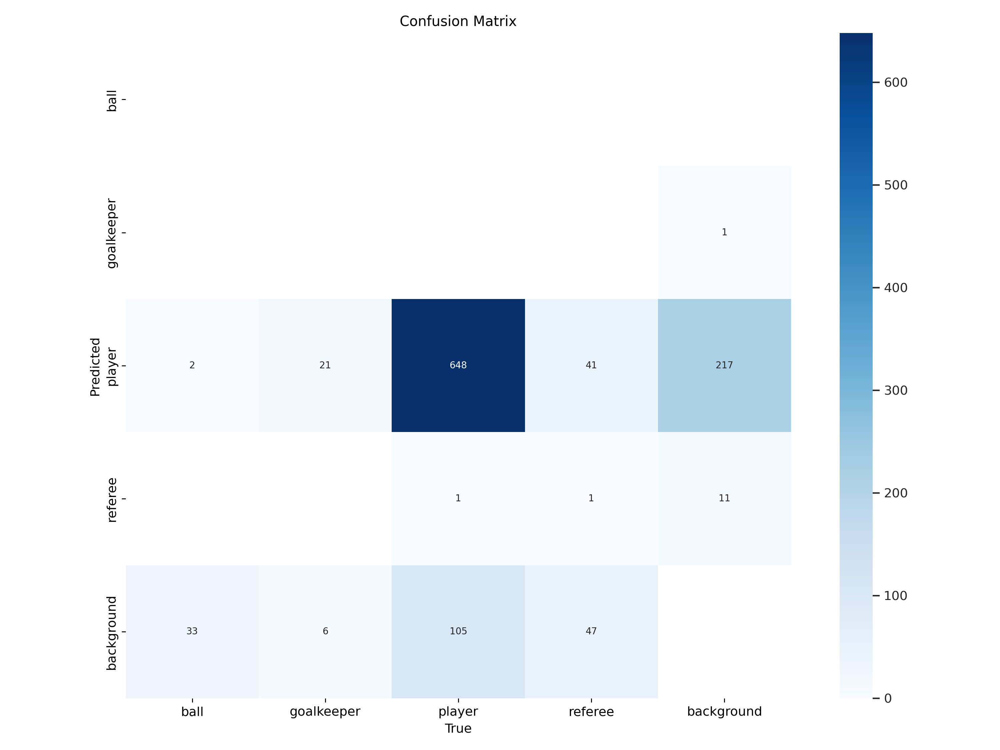

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


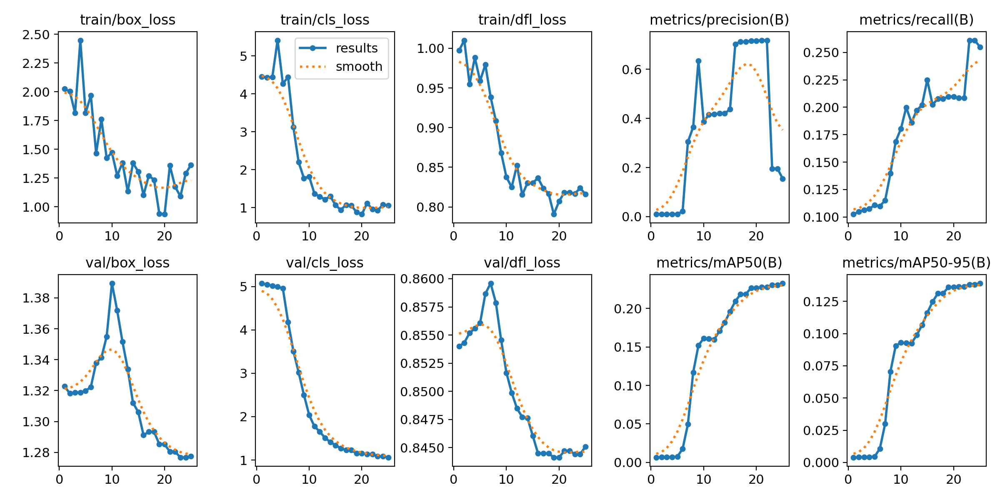

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

### Look at model predictions

In [18]:
!yolo task=detect mode=predict model=runs/detect/train2/weights/best.pt source={dataset.location}/test/images

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs

image 1/13 /content/datasets/football-players-detection-1/test/images/40cd38_7_6_png.rf.68ef7fcd663cdf0f5b96bacdbcd94e07.jpg: 384x640 23 players, 91.2ms
image 2/13 /content/datasets/football-players-detection-1/test/images/42ba34_1_5_png.rf.4337fde8fbe3640cf4351fb41ac9c3ca.jpg: 384x640 21 players, 10.7ms
image 3/13 /content/datasets/football-players-detection-1/test/images/42ba34_5_5_png.rf.ceb556bd4c92d41496ae1d8c56600c4a.jpg: 384x640 26 players, 10.8ms
image 4/13 /content/datasets/football-players-detection-1/test/images/4b770a_1_4_png.rf.5a45b3b841a06de414ceb802e34c136f.jpg: 384x640 25 players, 10.8ms
image 5/13 /content/datasets/football-players-detection-1/test/images/4b770a_3_6_png.rf.d0d9403f2f73ca0da7a6a1373c02b749.jpg: 384x640 22 players, 10.7ms
image 6/13 /content/datasets/football-players-detection-1/test/im

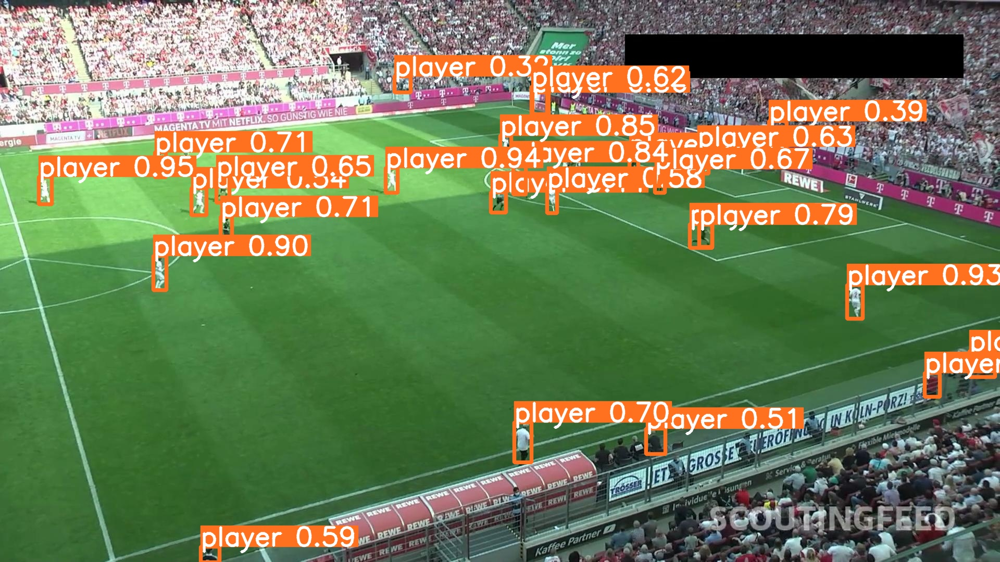

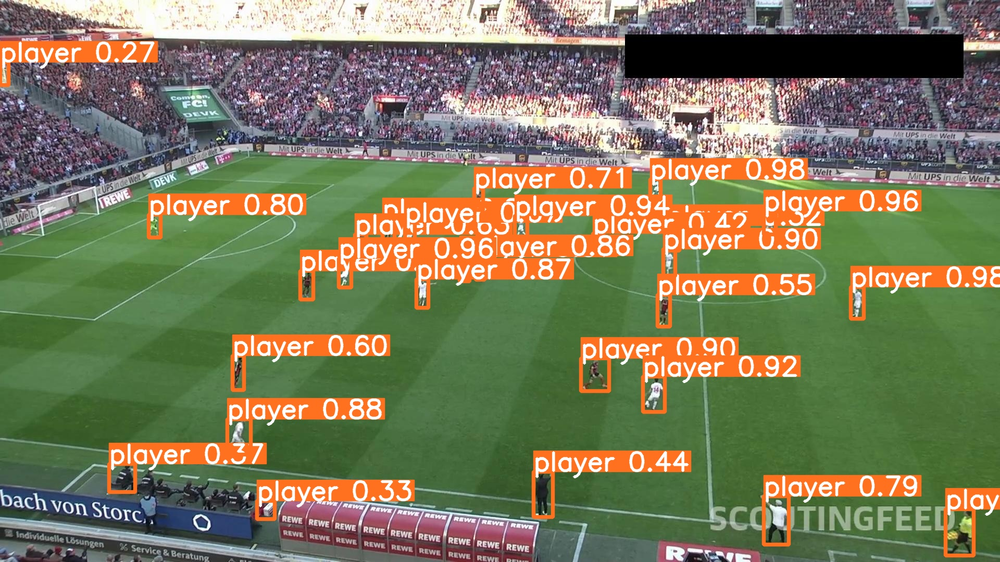

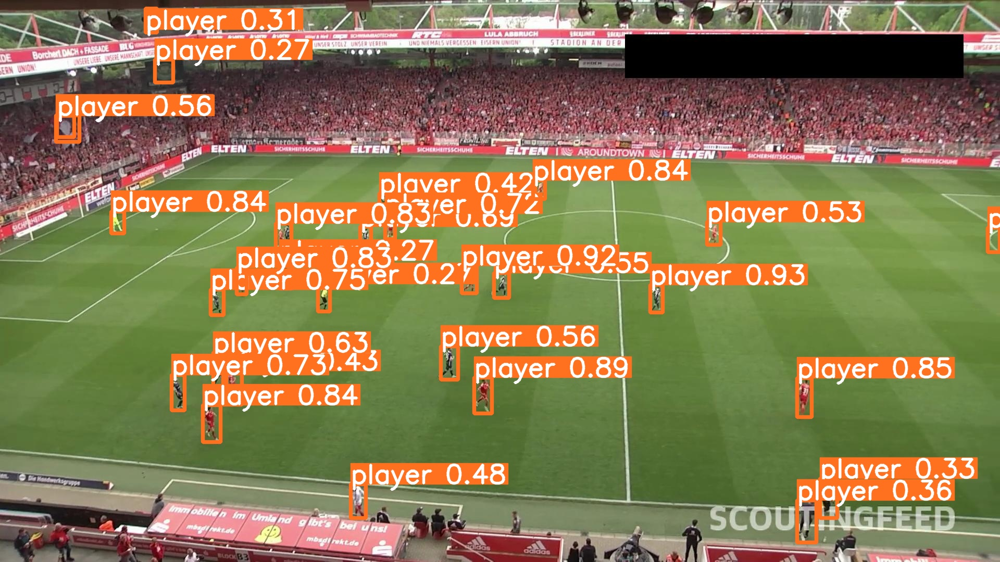

In [19]:
for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

### Download file Programmatically

```py
from google.colab import files
files.download('example.txt')
```

In [14]:
from google.colab import files
files.download(f'{dataset.location}/data.yaml')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Terminate Colab Sessions Programmatically

You can [terminate Colab sessions programmatically](https://twitter.com/GoogleColab/status/1569389018311426051?lang=en) with the following code:

```
from google.colab import runtime
runtime.unassign()
```

The `unassign()` function marks the currently connected runtime for deletion and disconnects any notebook sessions.


**Combine `files.download()` and `runtimne.unassign()` after training for a number of `epochs` or specific `time` in hours (both can be set in `data.yaml`) to save compute units.**

- `epochs` (default: 100) - Total number of training epochs. Each epoch represents a full pass over the entire dataset. Adjusting this value can affect training duration and model performance.

- `time` (default: None) - Maximum training time in hours. If set, this overrides the epochs argument, allowing training to automatically stop after the specified duration. Useful for time-constrained training scenarios.

See [Model Export](https://docs.ultralytics.com/modes/export/) for information about saving your mdoel.

In [15]:
%load_ext tensorboard
%tensorboard --logdir {HOME}/runs

<IPython.core.display.Javascript object>